# Covid-19 predictor using Linear Regression and Random Forest Regression

In [7]:
import numpy as np
import pandas as pd
from pandas import DataFrame
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport

### 1. Load dataset from -  https://covid.ourworldindata.org/data/owid-covid-data.csv

In [8]:
df1=pd.read_csv("../input/coviddata/owid-covid-data.csv")

In [9]:
df1.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
0,AFG,Asia,Afghanistan,2019-12-31,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
1,AFG,Asia,Afghanistan,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
2,AFG,Asia,Afghanistan,2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
3,AFG,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
4,AFG,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83


In [10]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32584 entries, 0 to 32583
Data columns (total 34 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   iso_code                         32520 non-null  object 
 1   continent                        32312 non-null  object 
 2   location                         32584 non-null  object 
 3   date                             32584 non-null  object 
 4   total_cases                      32222 non-null  float64
 5   new_cases                        32222 non-null  float64
 6   total_deaths                     32222 non-null  float64
 7   new_deaths                       32222 non-null  float64
 8   total_cases_per_million          32158 non-null  float64
 9   new_cases_per_million            32158 non-null  float64
 10  total_deaths_per_million         32158 non-null  float64
 11  new_deaths_per_million           32158 non-null  float64
 12  new_tests         

### 2. Subset only those rows that have “India” in the “location” column. This subsetted dataframe will be used for modelling.

In [11]:
print("There are",(df1['location']=='India').sum(),"entries of India in the location column in the dataset.")

There are 207 entries of India in the location column in the dataset.


In [12]:
print("There are",df1['location'].isnull().sum(),"null values in the location column.")

There are 0 null values in the location column.


In [13]:
print(((df1['location']=='India').sum())/(df1['location'].notnull().sum())*100,"% of rows contain India in the location column.")

0.6352811195678861 % of rows contain India in the location column.


In [14]:
df=df1.copy()

In [15]:
df.drop(df[df['location']!='India'].index,inplace=True)

In [16]:
df.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
13637,IND,Asia,India,2019-12-31,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
13638,IND,Asia,India,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
13639,IND,Asia,India,2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
13640,IND,Asia,India,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
13641,IND,Asia,India,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66


In [17]:
ProfileReport(df)

### 3. Univariate Analysis:

#### a. Find mean, median and mode of each column

In [50]:
var_num=df.select_dtypes(exclude=['object']).columns.tolist()
var_num

['date',
 'total_cases',
 'new_cases',
 'total_deaths',
 'new_deaths',
 'total_cases_per_million',
 'new_cases_per_million',
 'total_deaths_per_million',
 'new_deaths_per_million',
 'new_tests',
 'total_tests',
 'total_tests_per_thousand',
 'new_tests_per_thousand',
 'new_tests_smoothed',
 'new_tests_smoothed_per_thousand',
 'stringency_index',
 'population',
 'population_density',
 'median_age',
 'aged_65_older',
 'aged_70_older',
 'gdp_per_capita',
 'extreme_poverty',
 'cardiovasc_death_rate',
 'diabetes_prevalence',
 'female_smokers',
 'male_smokers',
 'handwashing_facilities',
 'hospital_beds_per_thousand',
 'life_expectancy']

In [19]:
dict1={}
dict2={}
list1=[]
for i in var_num:
    dict2['mean']=df[i].mean()
    dict2['median']=df[i].median()
    dict2['mode']=df[i].value_counts().index[0]
    dict2['min']=df[i].min()
    dict2['max']=df[i].max()
    range=(df[i].max())-(df[i].min())
    if range!=0:
        list1.append(i)
    dict1[i]=dict2
    dict2={}

In [20]:
import json
json_object = json.dumps(dict1)
df2=pd.read_json(json_object)

In [21]:
df2.head()

,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
mean,1.767549e+05,6458.2657,4894.057971,151.487923,128.082812,4.679889,3.546411,0.109758,131838.637931,4.444777e+06,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
median,9.152000e+03,942.0000,308.000000,34.000000,6.632000,0.683000,0.223000,0.025000,111993.500000,2.988506e+06,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
mode,0.000000e+00,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,176959.000000,9.969662e+06,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
min,0.000000e+00,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,157.000000,6.500000e+03,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
max,1.336861e+06,49310.0000,31358.000000,2003.000000,968.737000,35.732000,22.723000,1.451000,361024.000000,1.542817e+07,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66


In [22]:
print("The list of numeric features without constant value is :\n",list1)

The list of numeric features without constant value is :
 ['total_cases', 'new_cases', 'total_deaths', 'new_deaths', 'total_cases_per_million', 'new_cases_per_million', 'total_deaths_per_million', 'new_deaths_per_million', 'new_tests', 'total_tests', 'total_tests_per_thousand', 'new_tests_per_thousand', 'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'stringency_index']


#### b. Draw histograms of each numerical variable

total_cases


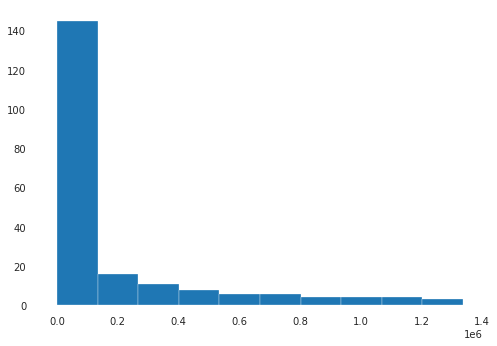

new_cases


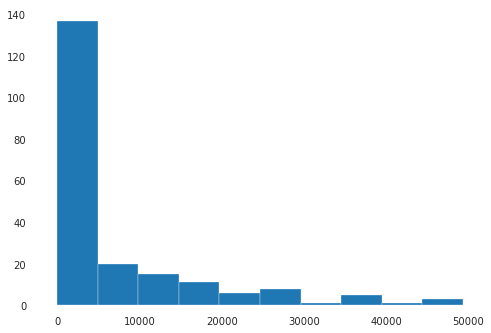

total_deaths


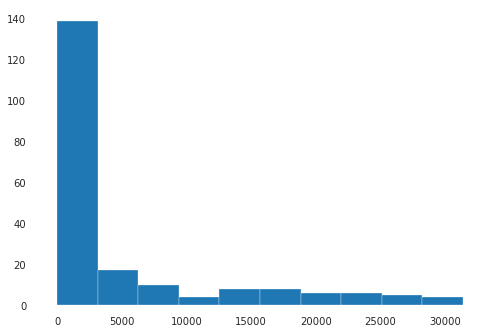

new_deaths


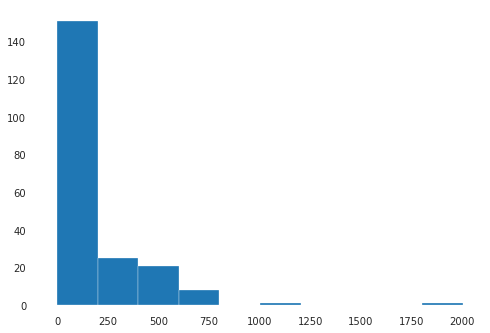

total_cases_per_million


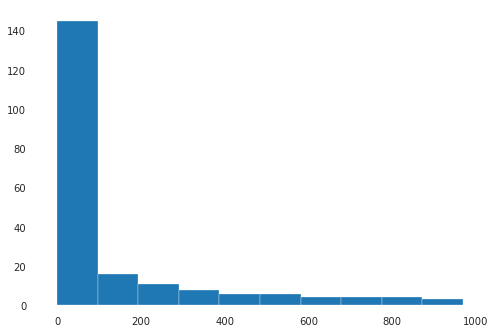

new_cases_per_million


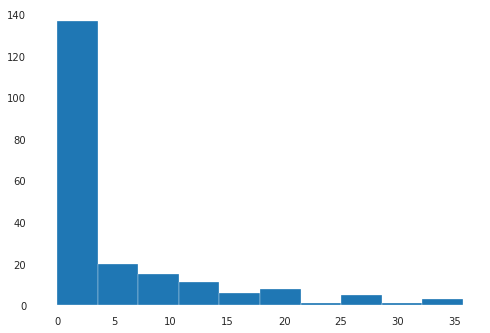

total_deaths_per_million


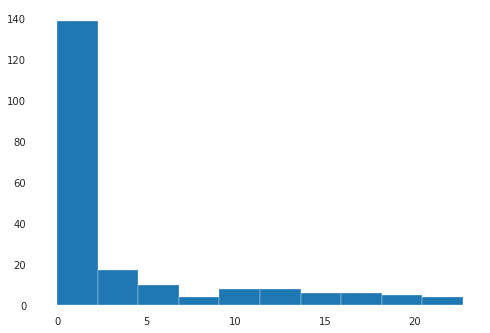

new_deaths_per_million


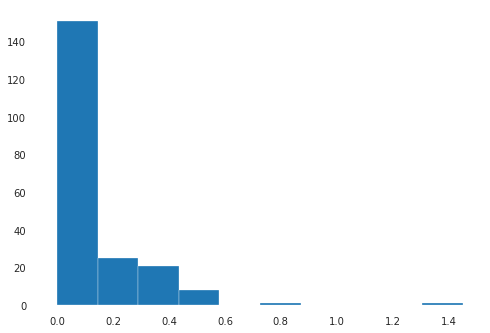

new_tests


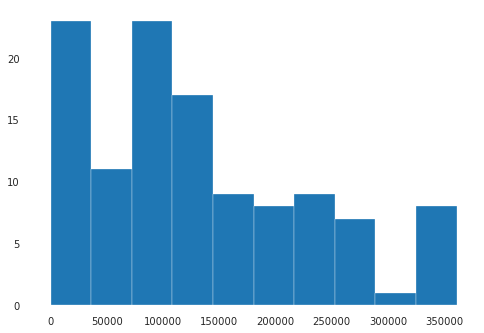

total_tests


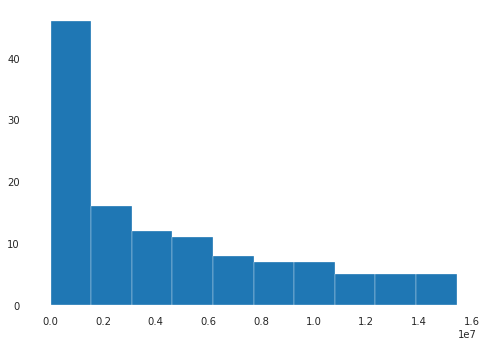

total_tests_per_thousand


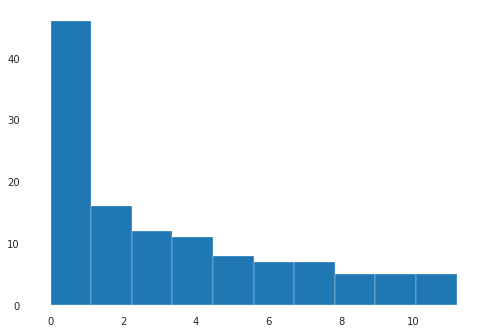

new_tests_per_thousand


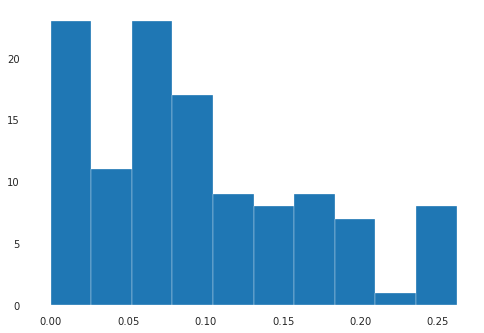

new_tests_smoothed


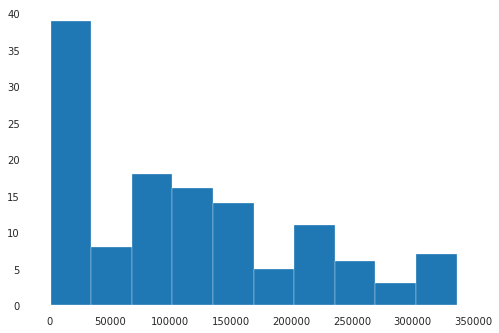

new_tests_smoothed_per_thousand


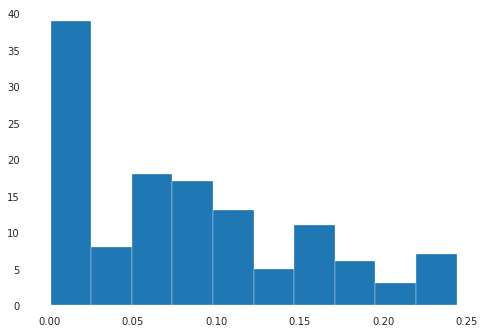

stringency_index


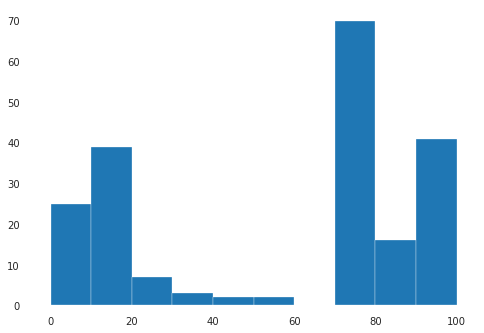

In [23]:
for z in list1:
    print(z)
    plt.figure(z)
    plt.hist(df[z],bins=10)
    plt.show()

### 4. Bivariate Analysis:

#### a. Draw scatter plots of each numerical column versus one another

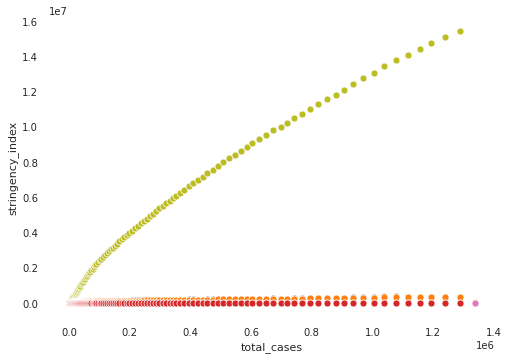

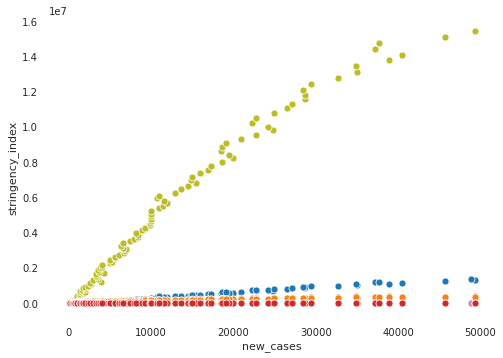

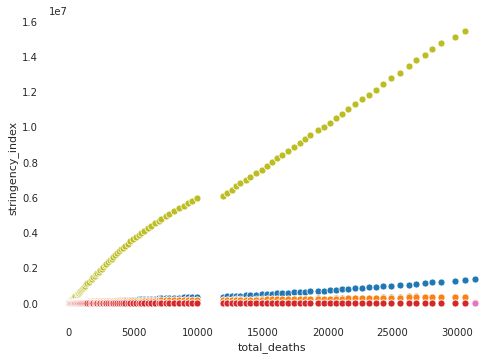

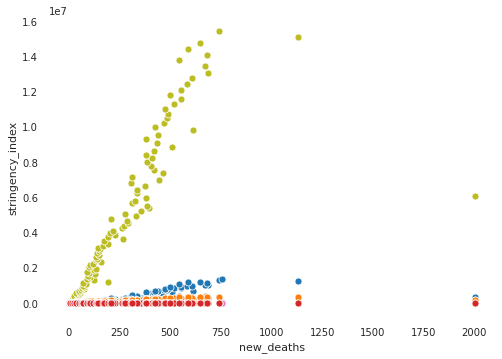

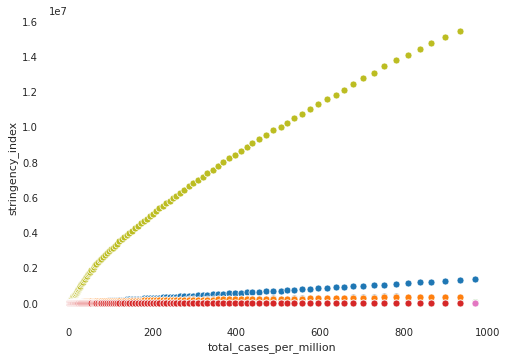

...

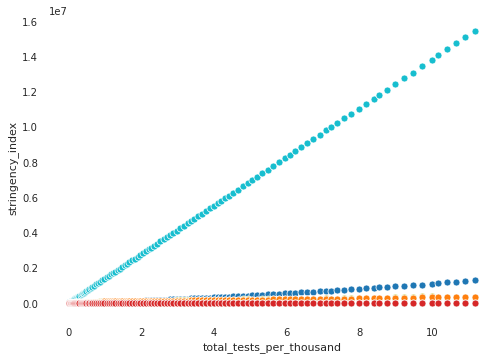

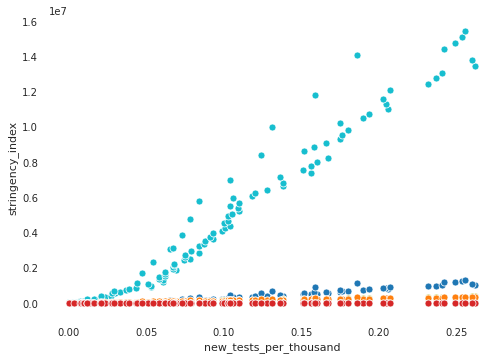

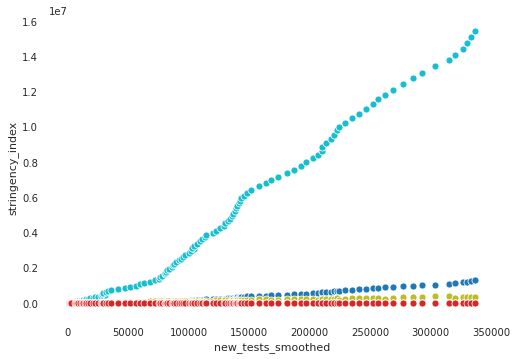

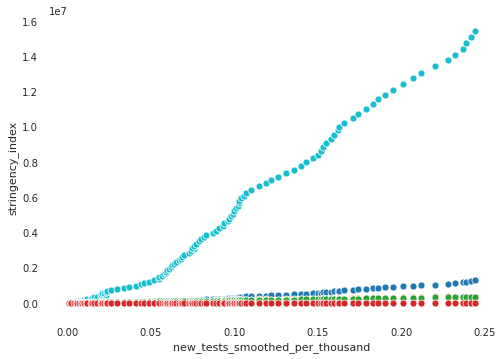

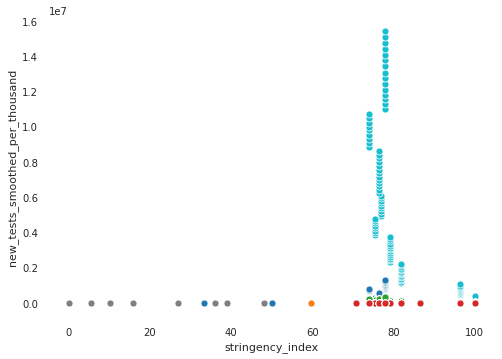

In [24]:
for i in list1:
    for j in list1:
        if i!=j:
            plt.figure(i)
            sns.scatterplot(df[i],df[j])

#### b. Draw line plots of each numerical column versus one another

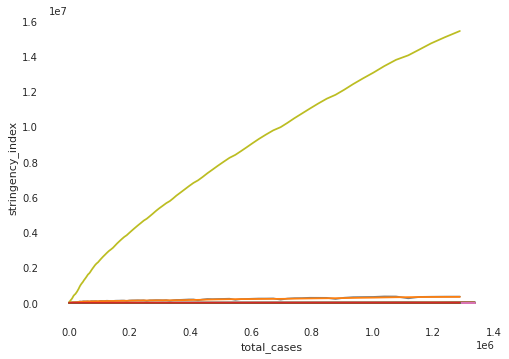

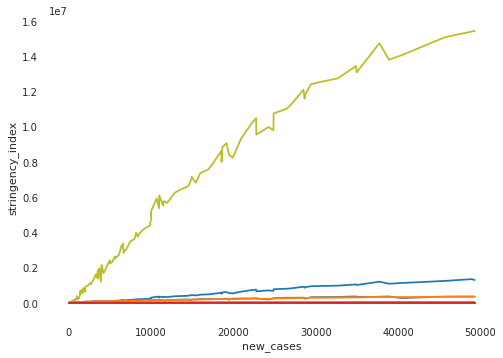

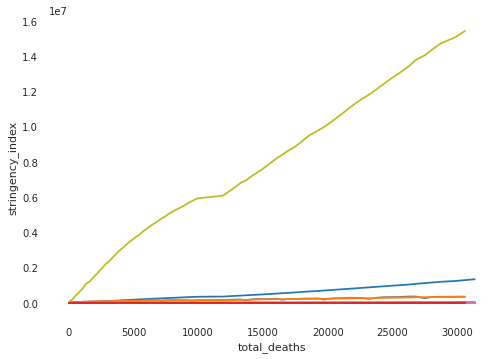

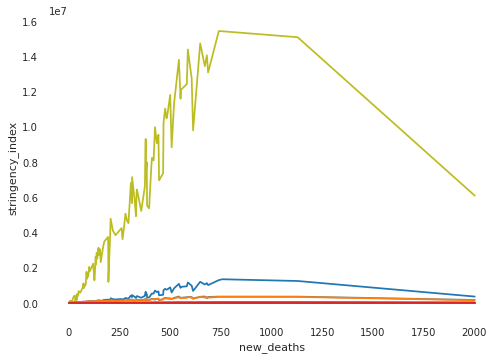

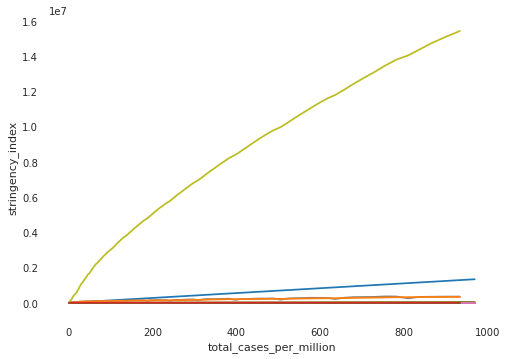

...

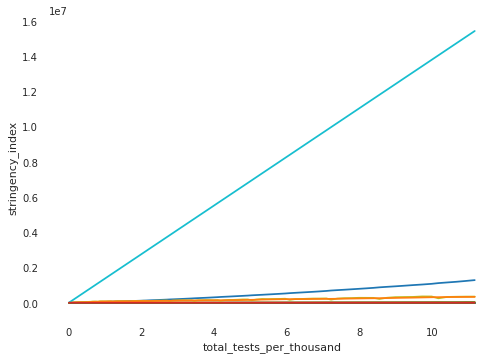

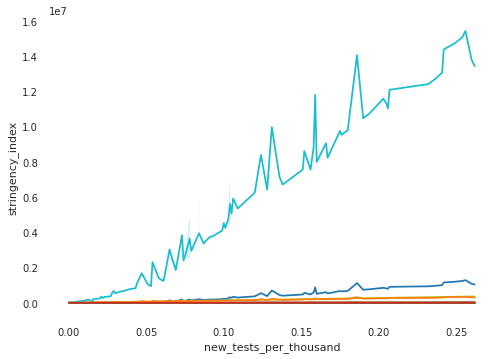

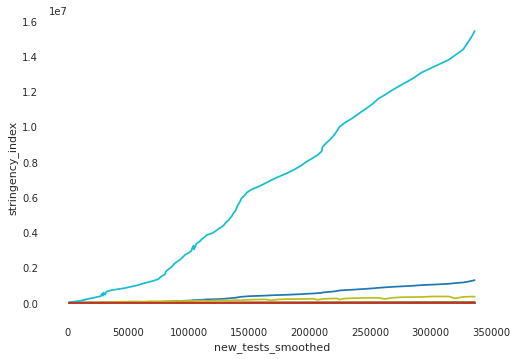

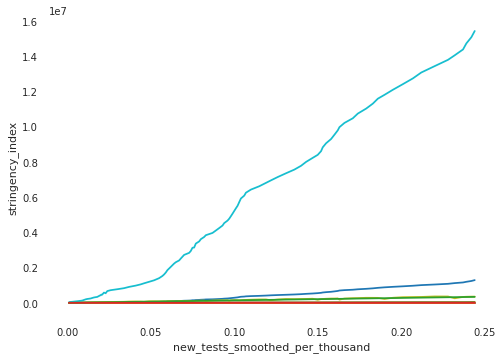

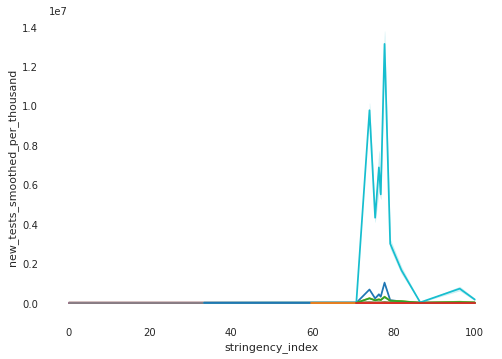

In [25]:
for i in list1:
    for j in list1:
        if i!=j:
            plt.figure(i)
            sns.lineplot(df[i],df[j])

### 5. Handle Missing values:

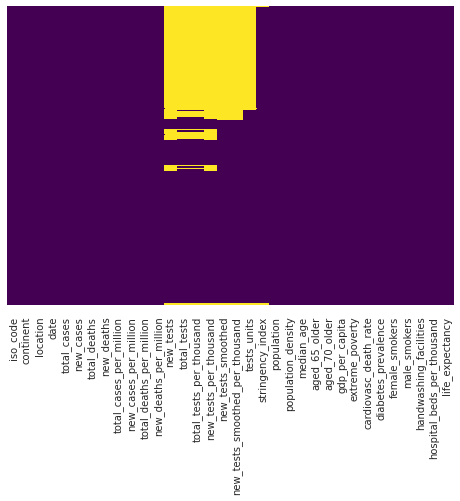

In [26]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [27]:
feature_with_na=[feature for feature in df.columns if df[feature].isnull().sum()>=1]
feature_with_na

['new_tests',
 'total_tests',
 'total_tests_per_thousand',
 'new_tests_per_thousand',
 'new_tests_smoothed',
 'new_tests_smoothed_per_thousand',
 'tests_units',
 'stringency_index']

In [28]:
for i in feature_with_na:
    print(i,":",np.round(df[i].isnull().mean(),4)*100,"% missing values")

new_tests : 43.96 % missing values
total_tests : 41.06 % missing values
total_tests_per_thousand : 41.06 % missing values
new_tests_per_thousand : 43.96 % missing values
new_tests_smoothed : 38.65 % missing values
new_tests_smoothed_per_thousand : 38.65 % missing values
tests_units : 35.27 % missing values
stringency_index : 0.97 % missing values


#### a. If there are null values in numerical column, replace the null values by the mean of that column

In [29]:
numerical_with_na=[]
for j in feature_with_na:
    if df[j].dtypes!='O':
        numerical_with_na.append(j)

In [30]:
numerical_with_na

['new_tests',
 'total_tests',
 'total_tests_per_thousand',
 'new_tests_per_thousand',
 'new_tests_smoothed',
 'new_tests_smoothed_per_thousand',
 'stringency_index']

In [31]:
for i in numerical_with_na:
    df[i]=df[i].fillna(df[i].mean())

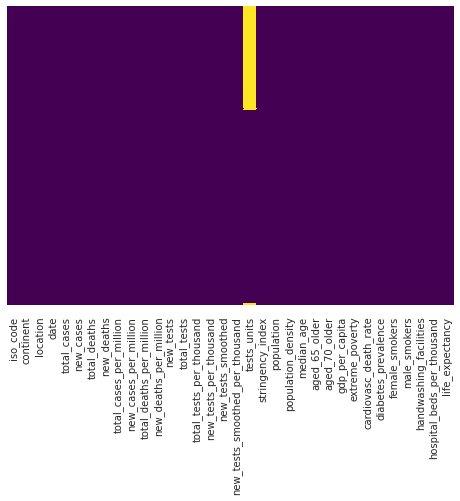

In [32]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

#### b. If there are null values in categorical column, replace the null values by the mode of that column

In [33]:
categorical_with_na=[]
for j in feature_with_na:
    if df[j].dtypes=='O':
        categorical_with_na.append(j)

In [34]:
print("Categorical features with null values are :\n",categorical_with_na)

Categorical features with null values are :
 ['tests_units']


In [35]:
for i in categorical_with_na:
    df[i]=df[i].fillna(df[i].value_counts().index[0])

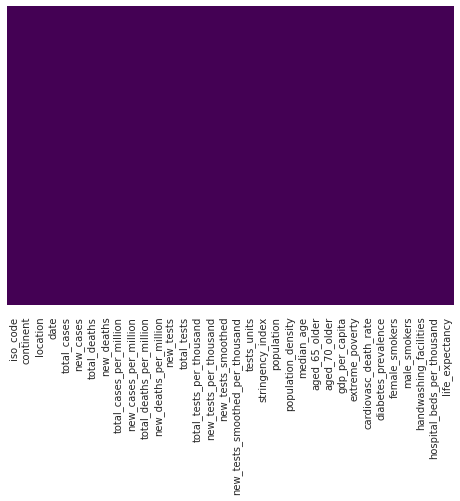

In [36]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

### 6. Convert date column to ordinal

In [37]:
import datetime as dt
df['date']=pd.to_datetime(df["date"]) 
df["date"]=df["date"].map(dt.datetime.toordinal)

In [38]:
df.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
13637,IND,Asia,India,737424,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
13638,IND,Asia,India,737425,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
13639,IND,Asia,India,737426,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
13640,IND,Asia,India,737427,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
13641,IND,Asia,India,737428,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66


### 7. Drop all categorical columns

In [39]:
var_cat=df.select_dtypes(include=['object']).columns.tolist()
var_cat

['iso_code', 'continent', 'location', 'tests_units']

In [40]:
df3=df.drop(var_cat,axis=1)
df3.head()

,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
13637,737424,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,131838.637931,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
13638,737425,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,131838.637931,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
13639,737426,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,131838.637931,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
13640,737427,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,131838.637931,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
13641,737428,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,131838.637931,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66


### 8. Select “total_cases” column as the target variable

In [41]:
y=df3['total_cases'].values

### 9. Select the other columns as the features(the “date” column has to be in the features)

In [42]:
df4=df3.drop('total_cases',axis=1)
X=df4.values

### 10. Perform train-test split

In [43]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2,random_state=0)

### 11. Modelling:

#### a. Linear Regression

In [44]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()  
regressor.fit(X_train, y_train) 

LinearRegression()

In [45]:
y_pred = regressor.predict(X_test)

#### b. Random Forest Regressor

In [46]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(n_estimators=500,random_state=0)
model.fit(X_train, y_train) 

RandomForestRegressor(n_estimators=500, random_state=0)

In [47]:
y_pred_rf=model.predict(X_test)

### 12. Get accuracy

Accuracy for Linear Regression :

Mean Absolute Error: 0.2852674338229506
Mean Squared Error: 0.14313492579643955
Root Mean Squared Error: 0.37833176683492964


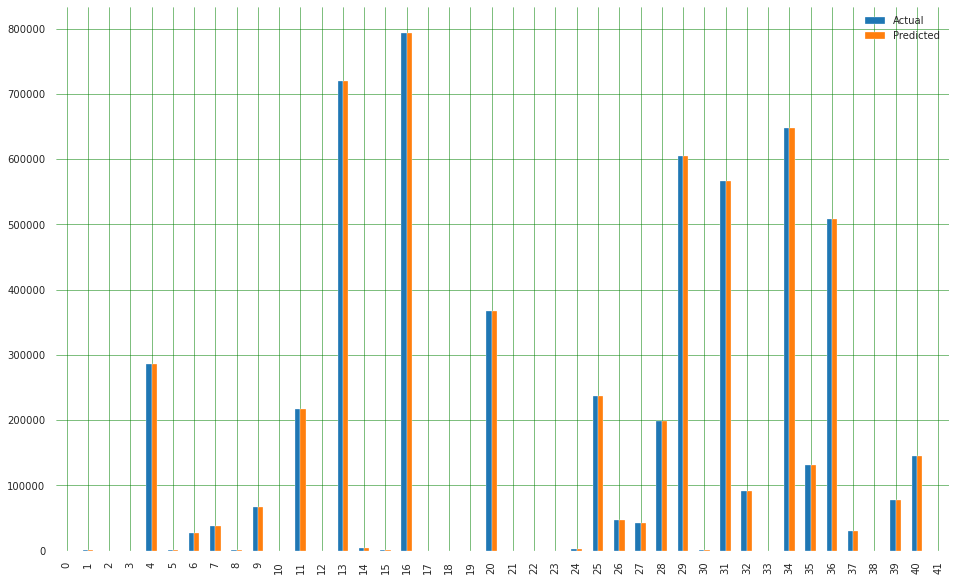

In [48]:
print("Accuracy for Linear Regression :\n")
from sklearn.metrics import classification_report,accuracy_score
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
#visualize comparison result as a bar graph
df5 = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
dfpred = df5.head(50)
dfpred.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

Accuracy for Random Forest Regression :

Root Mean Squared Error: 0.9992638024980567


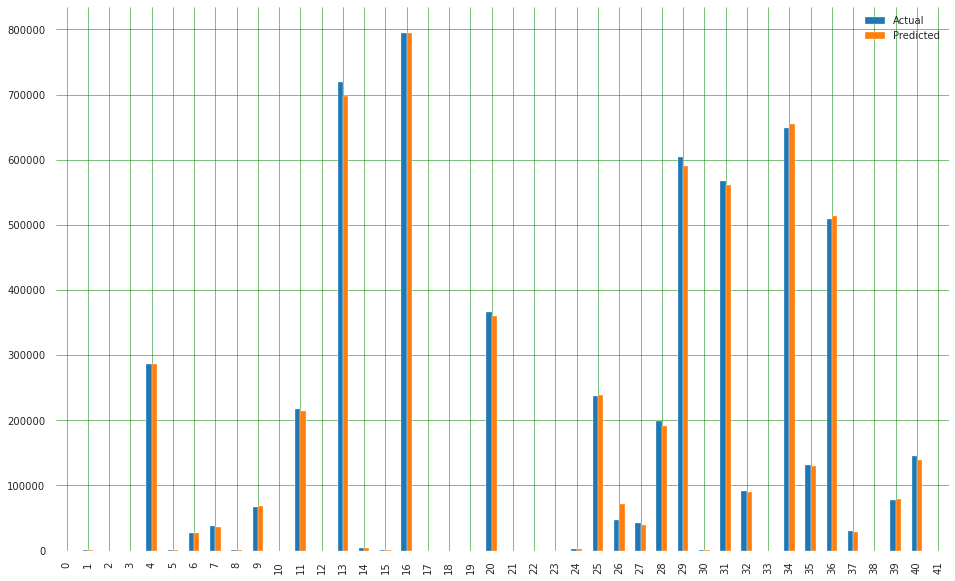

In [49]:
print("Accuracy for Random Forest Regression :\n")
from sklearn.metrics import classification_report,accuracy_score
from sklearn import metrics
print('Root Mean Squared Error:', metrics.r2_score(y_test,y_pred_rf))
#visualize comparison
df6 = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred_rf.flatten()})
dfpred = df6.head(50)
dfpred.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()